# Topic Modelling

## Installing the Necessary Libraries

In [1]:
#upload the data
import pandas as pd
tweets = pd.read_csv('tweets.csv')
grTweets = pd.read_csv('groupedTweets.csv')
tweets.columns
grTweets.columns

Index(['group', 'tweetID', 'username', 'text', 'qScore', 'nScore'], dtype='object')

In [4]:
pip install en_core_web_sm

Note: you may need to restart the kernel to use updated packages.


In [21]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install en_core_web_sm

Note: you may need to restart the kernel to use updated packages.


In [29]:
pip install pyLDAvis

Note: you may need to restart the kernel to use updated packages.


In [2]:
import gensim,spacy,logging, warnings
from collections import Counter
from gensim.parsing.preprocessing import remove_stopwords, strip_tags, strip_punctuation
import emoji
from gensim.corpora import Dictionary
import gensim.corpora as corpora

In [3]:
#import all necessary libraries
import re

import numpy as np

import pandas as pd

from pprint import pprint

import gensim

import gensim.corpora as corpora

from gensim.utils import simple_preprocess

from nltk.corpus import stopwords

from gensim.models import CoherenceModel

import spacy

import matplotlib.pyplot as plt

import nltk

import spacy

from matplotlib import colors as mcolors

import pyLDAvis.gensim


nltk.download('stopwords')

nlp=spacy.load('en_core_web_sm',disable=['parser', 'ner'])

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sahre\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Details of Tweets Dataframe

In [4]:
#Details of the tweets Dataset
num_rows = len(tweets)
num_rows -= 1
average_length = tweets['text'].str.len().mean()

min_len = tweets["text"].apply(len).min()
max_len = tweets["text"].apply(len).max()

print(f"Number of items: {num_rows:.2f}")
print(f"Average length of text: {average_length:.2f}")
print(f"Minimum length: {min_len}")
print(f"Maximum length: {max_len}")

Number of items: 10000.00
Average length of text: 151.90
Minimum length: 18
Maximum length: 926


This following wordcloud showcases the top 100 tokens 

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=trans

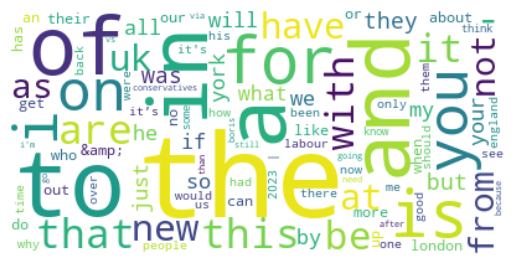

In [5]:
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt
all_text = ' '.join(tweets['text'])
tokens = all_text.lower().split()

top_tokens = dict(Counter(tokens).most_common(100))

wordcloud = WordCloud(background_color="white").generate_from_frequencies(top_tokens)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


In [6]:

regex_hashtags = r'#\w+'
regex_urls = r'https?://\S+'
tweets['num_hashtags'] = tweets['text'].apply(lambda x: len(re.findall(regex_hashtags, x)))
tweets['num_urls'] = tweets['text'].apply(lambda x: len(re.findall(regex_urls, x)))
print(f"Number of hashtags: {tweets['num_hashtags'].sum()}")
print(f"Number of URLs: {tweets['num_urls'].sum()}")

Number of hashtags: 6568
Number of URLs: 4815


In [7]:
word_counts = tweets['text'].str.split().apply(len)
max_word_count = np.max(word_counts)
min_word_count = np.min(word_counts)
avg_word_count = np.mean(word_counts)
print('Average word count per tweet: {:.0f}'.format(avg_word_count))
print('Maximum word count: {}'.format(max_word_count))
print('Minimum word count: {}'.format(min_word_count))

Average word count per tweet: 23
Maximum word count: 100
Minimum word count: 4


## Data Pre-processing

Before performing LDA, the data needs to be pre-processed. Hence, tokenisation, stemming, lemmatization, stopword removal and bi-gram and tri-gram modelling is carried out.

In [8]:
#tokenisation function

from gensim.utils import tokenize

def tokenize_text(text):
    return list(tokenize(text, lower=True))

In [9]:
#stemming function

import pandas as pd
from nltk.stem import SnowballStemmer

stemmer = SnowballStemmer('english')

def stem_text(tokens):
    stemmed_tokens = []
    for token in tokens:
        stemmed_tokens.append(stemmer.stem(token))
    return stemmed_tokens

In [10]:
tweets["tokens"] = tweets["text"].apply(tokenize_text)
tweets['tokens'] = tweets['tokens'].apply(stem_text)

In [11]:
#stopword removal list
import numpy as np
import pandas as pd
from pprint import pprint
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sahre\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Some additional stopwords are added that are not in the list provided by NLTK. Additionally, some words like "http", "co", etc., are based on the wordcloud

In [12]:
#extend stopwords list
stop_words = stopwords.words('english')
stop_words.extend(['http', 'https', 'co','amp','from','dont','else','said' ,'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])

Unique words and words that have a length of 1 (characters are emojis) are also removed.

In [13]:
#find unique words and words with length 1
from collections import Counter

tokens_list = tweets['tokens'].tolist()
all_tokens = [token for tokens in tokens_list for token in tokens]
token_counts = Counter(all_tokens)
unique_tokens = [token for token, count in token_counts.items() if count == 1]
len_1_tokens = list(set([token for token in all_tokens if len(token)==1]))

In [14]:
import re
def remove_stopwords(tokens):
    tok = []
    for token in tokens:
        # Remove special characters
        token = re.sub(r'[^\w\s]', '', token)

        # Remove links
        token = re.sub(r'http\S+', '', token)

        # Remove non-alphabetic and non-ascii characters
        token = ''.join(char for char in token if char.isalpha() or ord(char) < 128)

        if token not in stop_words and token not in unique_tokens and token not in len_1_tokens and not token.startswith('@'):
            tok.append(token)
    return tok

In [15]:
tweets['tokens'] = tweets['tokens'].apply(remove_stopwords)

In [16]:
# Create bigram model
bigram = gensim.models.Phrases(tweets["tokens"], min_count=5, threshold=100)
bigram_mod = gensim.models.phrases.Phraser(bigram)

# Create trigram model
trigram = gensim.models.Phrases(bigram_mod[tweets["tokens"]], min_count=5, threshold=100)
trigram_mod = gensim.models.phrases.Phraser(trigram)
tweets['tokens'] = [trigram_mod[bigram_mod[tweet]] for tweet in tweets['tokens']]

In [17]:
#lemmatization

import spacy

nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

def lemmatize(tweets, allowed_postags=['NOUN', 'ADJ', 'VERB']):
    lemmatized_tweets = []
    for token in tweets:
        doc = nlp(" ".join(token))
        lemmatized_tweets.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return lemmatized_tweets
lemmatize(tweets['tokens'], allowed_postags=[ 'NOUN', 'ADJ', 'VERB'])

[['pansexualflow',
  'certain',
  'claim',
  'cost',
  'analysi',
  'new',
  'restor',
  'relea',
  'odd'],
 ['foreign', 'ministri', 'weather', 'balloon', 'cour', 'dubai'],
 ['begin',
  'understand',
  'oper',
  'scheme',
  'purpos',
  'visit',
  'collect',
  'offer',
  'child',
  'love',
  'child',
  'lead'],
 ['regist', 'week', 'end', 'year', 'averag', 'happen', 'zd'],
 [],
 ['hors_race',
  'histori',
  'today',
  'race',
  'day',
  'hors_race',
  'news',
  'histori',
  'hor',
  'bet',
  'present',
  'race',
  'action',
  'australian',
  'oversea',
  'race',
  'news',
  'histori'],
 ['ridicul',
  'servic',
  'store',
  'rememb',
  'whi',
  'order',
  'treat',
  'staff',
  'wait'],
 ['live',
  'stream',
  'premier_leagu',
  'watch',
  'match',
  'head',
  'start',
  'part',
  'premier_leagu'],
 ['check', 'ebay_uk'],
 ['babylon', 'citi', 'foundat', 'gradual', 'ration', 'convent'],
 ['break', 'law'],
 ['awesom', 'giveaway'],
 ['check', 'loss', 'power', 'whi', 'rest', 'sit', 'law', 'star

In [18]:
#printing the top 100 tokens

from collections import Counter
all_tokens = [token for tweet in tweets['tokens'] for token in tweet]
token_counts = Counter(all_tokens)
top_100_tokens = token_counts.most_common(100)
for token, count in top_100_tokens:
    print(f"{token}: {count}")

uk: 1354
new: 1124
york: 792
london: 765
like: 584
conserv: 517
time: 511
peopl: 507
one: 483
labour: 459
us: 408
england: 406
work: 367
whi: 361
year: 354
day: 341
back: 334
tori: 317
live: 305
look: 303
love: 288
onli: 281
well: 248
scotland: 246
citi: 243
vote: 240
still: 239
vs: 238
support: 238
parti: 237
race: 231
becaus: 228
play: 225
ani: 221
show: 214
never: 205
got: 205
great: 198
realli: 193
veri: 192
ticket: 190
thing: 189
much: 189
start: 188
way: 188
best: 188
man: 188
first: 184
game: 182
last: 179
world: 177
let: 176
pleas: 175
tri: 174
watch: 172
call: 172
countri: 167
bori: 166
wale: 165
stop: 164
news: 162
free: 161
link: 161
week: 155
govern: 155
help: 155
mani: 155
give: 149
money: 149
win: 147
team: 147
eu: 146
made: 144
better: 144
check: 143
today: 140
anoth: 140
big: 140
state: 140
pm: 139
hope: 138
manchest: 136
everi: 133
befor: 131
next: 129
th: 128
part: 128
interest: 128
two: 128
end: 127
pay: 126
find: 125
doe: 123
job: 123
book: 122
prime_minist: 121
hom

## Word Cloud with Top 100 tokens for Tweets Datafame

The Word Cloud for Top 100 Tokens is quite different from the one plotted before pre-processing.

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=trans

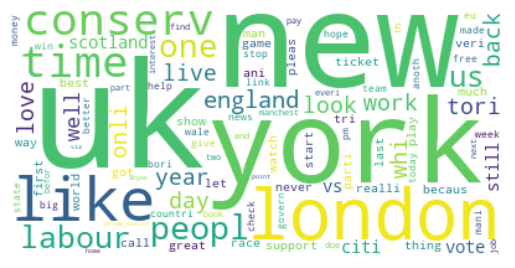

In [19]:
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

tokens = [token for sublist in tweets['tokens'] for token in sublist]

top_tokens = dict(Counter(tokens).most_common(100))

wordcloud = WordCloud(background_color="white").generate_from_frequencies(top_tokens)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Selection of Number of Topics

First, the coherence scores from 3 to 40 are plotted with a step size of 5 to get a general idea on the coherence trend as the topics increase.

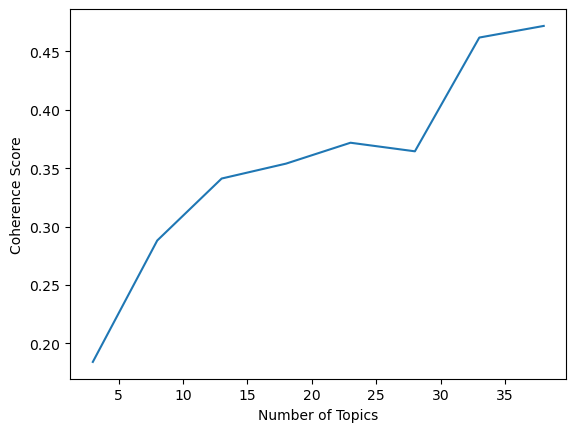

In [562]:
#to find out the most appropriate value of K, calculate coherence scores and perplexity score for different topics

from gensim.models.ldamodel import LdaModel
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt

dictionary = Dictionary(tweets['tokens'])
corpus = [dictionary.doc2bow(text) for text in tweets['tokens']]

min_topics = 3
max_topics = 40
step_size = 5
coherence_scores = []
perplexity_scores = []
for num_topics in range(min_topics, max_topics+1, step_size):
    lda_model = LdaModel(
        corpus=corpus,
        id2word=dictionary,
        num_topics=num_topics,
        random_state=100,
        update_every=1,
        chunksize=100,
        passes=50,
        alpha='auto',
        per_word_topics=True
    )
    coherence_model_lda = CoherenceModel(
        model=lda_model,
        texts=tweets['tokens'],
        dictionary=dictionary,
        coherence='c_v'
    )
    coherence_scores.append(coherence_model_lda.get_coherence())
    perplexity_scores.append(lda_model.log_perplexity(corpus))

plt.plot(range(min_topics, max_topics+1, step_size), coherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.show()

To prevent overfitting based on the possible topics on manual analysis, the coherence scores are checked within a lesser range.

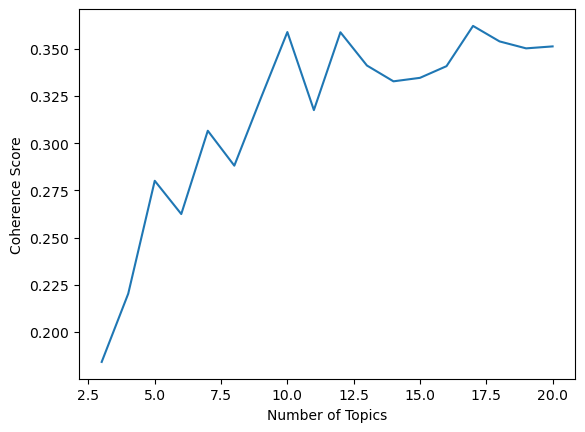

In [531]:
#to find out the most appropriate value of K, calculate coherence scores and perplexity score for different topics

from gensim.models.ldamodel import LdaModel
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt

dictionary = Dictionary(tweets['tokens'])
corpus = [dictionary.doc2bow(text) for text in tweets['tokens']]

min_topics = 2
max_topics = 20
step_size = 1
coherence_scores = []
perplexity_scores = []
for num_topics in range(min_topics, max_topics+1, step_size):
    lda_model = LdaModel(
        corpus=corpus,
        id2word=dictionary,
        num_topics=num_topics,
        random_state=100,
        update_every=1,
        chunksize=100,
        passes=50,
        alpha='auto',
        per_word_topics=True
    )
    coherence_model_lda = CoherenceModel(
        model=lda_model,
        texts=tweets['tokens'],
        dictionary=dictionary,
        coherence='c_v'
    )
    coherence_scores.append(coherence_model_lda.get_coherence())
    perplexity_scores.append(lda_model.log_perplexity(corpus))

plt.plot(range(min_topics, max_topics+1, step_size), coherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.show()

In [447]:
#coherence_scores

[0.1922058124544146,
 0.18420852548007782,
 0.22033504510559138,
 0.28010963833941055,
 0.26250016893528655,
 0.30660561485889176,
 0.28811419341535127,
 0.3238591877864281,
 0.3588507912238523,
 0.31753679292214493,
 0.3587408210360247,
 0.3411376378711755,
 0.3327652129144048,
 0.3346158335531159,
 0.3407968383013986,
 0.3621019340824418,
 0.3539011323089026,
 0.35022208717098624,
 0.3512598541001322]

In [370]:
#perplexity_scores

[-8.524913581689454,
 -8.662251054490332,
 -8.766477863227825,
 -8.809648578488824,
 -8.861507745617612,
 -8.916583913144024,
 -9.007040776070943,
 -9.174603383179594,
 -9.488193812297663,
 -10.005151546573329,
 -10.864689168902563,
 -12.078009294809595,
 -13.873426609772867,
 -15.935642948007429,
 -17.559276853366857,
 -18.48186292181803,
 -19.074912683738567,
 -19.697406332589484,
 -20.314926549219926]

The perplexity scores are also plotted. Gensim converts these to logarithmic scales, hence these are converted to their exponential forms.

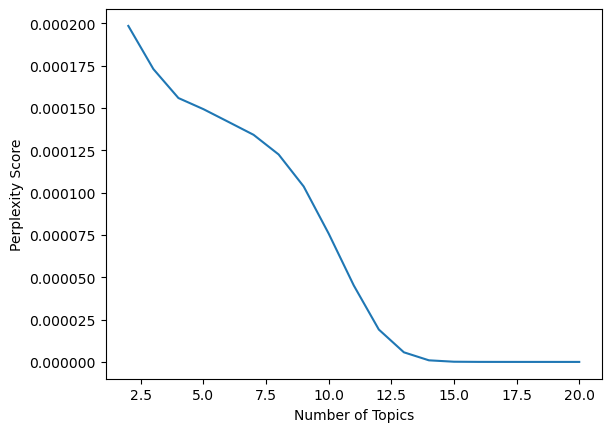

In [344]:
import matplotlib.pyplot as plt
from math import exp


true_perplexity_scores = [exp(score) for score in perplexity_scores]

# plot the perplexity scores against the number of topics 

num_topics = range(2, 21)
plt.plot(num_topics, true_perplexity_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Perplexity Score')
plt.show()


In [369]:
#true_perplexity_scores

[0.0001984618670785329,
 0.00017299444834195595,
 0.00015587161610524375,
 0.00014928570893111228,
 0.0001417411933090589,
 0.00013414571638369971,
 0.00012254395499279472,
 0.00010363832302413501,
 7.574078188267074e-05,
 4.516665129822765e-05,
 1.9121653596604948e-05,
 5.683125032147385e-06,
 9.437291684683917e-07,
 1.2001573857083637e-07,
 2.366480642632978e-08,
 9.406518582176559e-09,
 5.198411786216475e-09,
 2.789492011032626e-09,
 1.5043174710489408e-09]

## Applying LDA on chosen number of topics

Based on the graphs, the number of topics is chosen as 17 and LDA is carried out.

In [584]:
#applying LDA
gensim_dictionary = corpora.Dictionary(tweets['tokens'])
texts = tweets['tokens']
gensim_corpus = [gensim_dictionary.doc2bow(text) for text in texts]


lda_model = gensim.models.ldamodel.LdaModel(

   corpus=gensim_corpus, id2word=gensim_dictionary, num_topics=17, random_state=100, 

   update_every=1, chunksize=100, passes=50, alpha='auto', per_word_topics=True

)

coherence_model_lda = CoherenceModel(

   model=lda_model, texts=tweets['tokens'], dictionary=gensim_dictionary, coherence='c_v')

coherence_lda = coherence_model_lda.get_coherence()

print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.3621019340824418


## KL Divergence

In [596]:
#compute KL divergence
import numpy as np
from scipy.stats import entropy

topic_term_dists = lda_model.get_topics()
num_topics = lda_model.num_topics

kl_divs = np.zeros((num_topics, num_topics))
for i in range(num_topics):
    for j in range(i+1, num_topics):
        kl_divs[i,j] = entropy(topic_term_dists[i], topic_term_dists[j])
        kl_divs[j,i] = entropy(topic_term_dists[j], topic_term_dists[i])

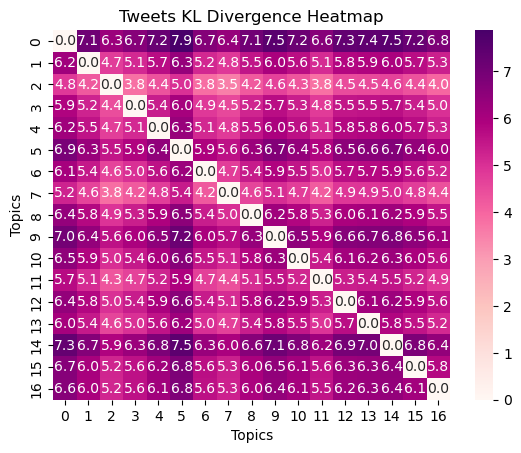

In [597]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(kl_divs, cmap="RdPu", annot=True, fmt=".1f")
plt.title("Tweets KL Divergence Heatmap")
plt.xlabel("Topics")
plt.ylabel("Topics")
plt.show()

## Intertopic Distance Map

This cell might not show an output after exporting it from Jupytr for reasons unknown. Running the cell will definitely showcase the results. Alternatively, using the file in colab will show the results.

In [158]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, gensim_corpus, gensim_dictionary)
pyLDAvis.display(vis)

C:\Users\sahre\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



In [599]:
pyLDAvis.save_html(vis, 'lda.html')

## Jaccard Distance between Topics

The next two cells might not show an output after exporting it from Jupytr for reasons unknown. Running the cell will definitely showcase the results.

In [29]:
# Code retrieved from Gensim matutils here: https://radimrehurek.com/gensim/matutils.html
def plot_difference_plotly(mdiff, title="", annotation=None):
    """Plot the difference between models.

    Uses plotly as the backend."""
    import plotly.graph_objs as go
    import plotly.offline as py

    annotation_html = None
    if annotation is not None:
        annotation_html = [
            [
                "+++ {}<br>--- {}".format(", ".join(int_tokens), ", ".join(diff_tokens))
                for (int_tokens, diff_tokens) in row
            ]
            for row in annotation
        ]

    data = go.Heatmap(z=mdiff, colorscale='RdBu', text=annotation_html)
    layout = go.Layout(width=950, height=950, title=title, xaxis=dict(title="topic"), yaxis=dict(title="topic"))
    py.iplot(dict(data=[data], layout=layout))


def plot_difference_matplotlib(mdiff, title="", annotation=None):
    """Helper function to plot difference between models.

    Uses matplotlib as the backend."""
    import matplotlib.pyplot as plt
    fig, ax = plt.subplots(figsize=(18, 14))
    data = ax.imshow(mdiff, cmap='RdBu_r', origin='lower')
    plt.title(title)
    plt.colorbar(data)


try:
    get_ipython()
    import plotly.offline as py
except Exception:
    #
    # Fall back to matplotlib if we're not in a notebook, or if plotly is
    # unavailable for whatever reason.
    #
    plot_difference = plot_difference_matplotlib
else:
    py.init_notebook_mode()
    plot_difference = plot_difference_plotly

In [203]:
import numpy as np

mdiff, annotation = lda_model.diff(lda_model, distance='jaccard', num_words=50)


In [204]:
plot_difference(mdiff, title="Topic difference (one model) [jaccard distance]", annotation=annotation)

C:\Users\sahre\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\sahre\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



## Grouped Tweets 

Similarly, the same set of functions are applied on the Grouped Tweets dataste.

In [35]:
import pandas as pd
grouped_tweets = grTweets.groupby('group')['text'].apply(' '.join).reset_index()

## Details of the Grouped Dataframe

In [37]:
#Details of the grouped tweets Dataset
num_rows = len(grouped_tweets)
num_rows -= 1
average_length = grouped_tweets['text'].str.len().mean()

min_len = grouped_tweets["text"].apply(len).min()
max_len = grouped_tweets["text"].apply(len).max()

print(f"Number of items: {num_rows:.2f}")
print(f"Average length of text: {average_length:.2f}")
print(f"Minimum length: {min_len}")
print(f"Maximum length: {max_len}")

Number of items: 470.00
Average length of text: 3235.56
Minimum length: 31
Maximum length: 152602


In [38]:
regex_hashtags = r'#\w+'
regex_urls = r'https?://\S+'
grouped_tweets['num_hashtags'] = grouped_tweets['text'].apply(lambda x: len(re.findall(regex_hashtags, x)))
grouped_tweets['num_urls'] = grouped_tweets['text'].apply(lambda x: len(re.findall(regex_urls, x)))
print(f"Number of hashtags: {grouped_tweets['num_hashtags'].sum()}")
print(f"Number of URLs: {grouped_tweets['num_urls'].sum()}")


Number of hashtags: 6556
Number of URLs: 4802


In [39]:
word_counts = grouped_tweets['text'].str.split().apply(len)
max_word_count = np.max(word_counts)
min_word_count = np.min(word_counts)
avg_word_count = np.mean(word_counts)
print('Average word count per tweet: {:.0f}'.format(avg_word_count))
print('Maximum word count: {}'.format(max_word_count))
print('Minimum word count: {}'.format(min_word_count))

Average word count per tweet: 496
Maximum word count: 22971
Minimum word count: 4


## Word Cloud for Grouped Tweets before Pre-Processing

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning:

textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning:

textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning:

textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning:

textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.

C:\User

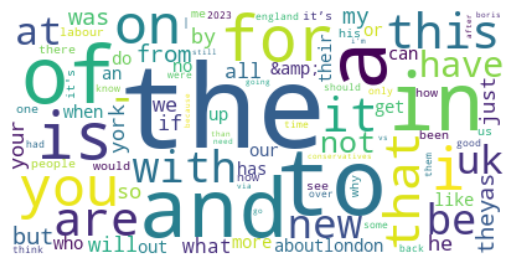

In [40]:
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

all_text = ' '.join(grouped_tweets['text'].tolist())
tokens = all_text.lower().split()

top_tokens = dict(Counter(tokens).most_common(100))

wordcloud = WordCloud(background_color="white").generate_from_frequencies(top_tokens)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


## Pre-processing of Grouped Tweets

In [41]:
#tokenisation, stemming
grouped_tweets["tokens"] = grouped_tweets["text"].apply(tokenize_text)
grouped_tweets['tokens'] = grouped_tweets['tokens'].apply(stem_text)

In [42]:
#stopword list, 
grouped_stop_words = stopwords.words('english')
grouped_stop_words.extend(['http', 'https', 'co','amp','from','dont','else','said' ,'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])
grouped_tokens_list = grouped_tweets['tokens'].tolist()
grouped_all_tokens = [token for tokens in grouped_tokens_list for token in tokens]
grouped_token_counts = Counter(grouped_all_tokens)
grouped_unique_tokens = [token for token, count in grouped_token_counts.items() if count == 1] #Remove tokens with only 1 occurence
grouped_len_1_tokens = list(set([token for token in grouped_all_tokens if len(token)==1])) #Remove tokens with length 1



In [43]:
import re

def remove_stopwords_grouped(tokens):
    tok = []
    for token in tokens:
        # Remove special characters
        token = re.sub(r'[^\w\s]', '', token)

        # Remove links
        token = re.sub(r'http\S+', '', token)

        # Remove non-alphabetic and non-ascii characters
        token = ''.join(char for char in token if char.isalpha() or ord(char) < 128)

        if token not in grouped_stop_words and token not in grouped_unique_tokens and token not in grouped_len_1_tokens and not token.startswith('@'):
            tok.append(token)
    return tok

In [44]:
#stopword removal

grouped_tweets['tokens'] = grouped_tweets['tokens'].apply(remove_stopwords_grouped)



In [45]:
#Create bigrams and lemmatize tokens
gr_bigram = gensim.models.Phrases(grouped_tweets["tokens"], min_count=5, threshold=100)
gr_bigram_mod = gensim.models.phrases.Phraser(gr_bigram)
gr_trigram = gensim.models.Phrases(gr_bigram_mod[grouped_tweets["tokens"]], min_count=5, threshold=100)
gr_trigram_mod = gensim.models.phrases.Phraser(gr_trigram)
grouped_tweets['tokens'] = [gr_trigram_mod[gr_bigram_mod[tweet]] for tweet in grouped_tweets['tokens']]
lemmatize(grouped_tweets['tokens'], allowed_postags=[ 'NOUN', 'ADJ', 'VERB'])

[['pansexualflow',
  'certain',
  'claim',
  'cost',
  'analysi',
  'new',
  'restor',
  'relea',
  'odd',
  'realis',
  'context',
  'bit',
  'month',
  'month',
  'look',
  'clean',
  'era',
  'trick',
  'look',
  'bad',
  'stain',
  'area',
  'water',
  'problem',
  'problem',
  'rb',
  'real',
  'problem',
  'claim',
  'accur',
  'repre',
  'current',
  'state',
  'detail',
  'matter',
  'serious',
  'problem',
  'sister',
  'work',
  'look',
  'honest',
  'precious',
  'omg',
  'look',
  'look',
  'pig',
  'fli',
  'sunak',
  'wish',
  'respond',
  'plea',
  'give',
  'visa',
  'respon',
  'wish',
  'send',
  'god_bless',
  'planet',
  'gerwynthoma',
  'caerau',
  'point',
  'scream',
  'inclus',
  'hate',
  'leav',
  'whi',
  'whi',
  'look',
  'adapt',
  'mutat',
  'retriev',
  'depend',
  'test',
  'rememb',
  'crownhousepub',
  'gallagh',
  'mattp',
  'gallagh',
  'look_forward',
  'design',
  'wish',
  'respond',
  'plea',
  'give',
  'visa',
  'respon',
  'god_bless',
  'wro

In [263]:
#Top 100 tokens
from collections import Counter
gr_all_tokens = [token for tweet in grouped_tweets['tokens'] for token in tweet]
gr_token_counts = Counter(gr_all_tokens)
gr_top_100_tokens = gr_token_counts.most_common(100)
for token, count in gr_top_100_tokens:
    print(f"{token}: {count}")

uk: 1328
new: 1121
york: 788
london: 744
like: 554
conserv: 514
time: 509
peopl: 504
one: 481
labour: 458
us: 406
england: 402
work: 365
year: 354
day: 340
back: 333
whi: 331
tori: 316
look: 303
live: 303
love: 288
onli: 280
well: 248
scotland: 246
citi: 243
vote: 240
still: 239
vs: 238
support: 237
parti: 237
race: 231
becaus: 226
play: 225
ani: 219
show: 213
never: 204
got: 203
great: 198
realli: 193
veri: 192
much: 189
thing: 188
best: 188
way: 188
start: 188
man: 186
first: 183
game: 182
ticket: 181
last: 177
let: 176
world: 176
pleas: 175
tri: 174
call: 172
watch: 172
bori: 166
countri: 166
wale: 165
stop: 164
free: 161
link: 161
news: 161
help: 155
week: 155
govern: 155
mani: 154
give: 149
team: 147
win: 147
money: 147
eu: 146
made: 144
better: 144
check: 142
big: 140
anoth: 140
today: 140
hope: 138
manchest: 136
pm: 135
everi: 133
befor: 131
th: 128
part: 128
interest: 128
end: 127
state: 126
find: 125
two: 125
pay: 125
doe: 123
job: 123
book: 122
prime_minist: 121
home: 119
poi

## Word Cloud for Top Tokens in Grouped Tweets Dataframe After Pre-Processing

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning:

textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning:

textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning:

textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning:

textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.

C:\User

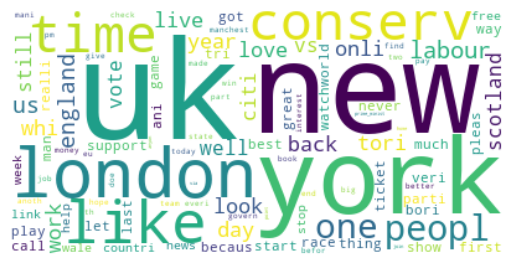

In [46]:
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

tokens = [token for sublist in grouped_tweets['tokens'] for token in sublist]

top_tokens = dict(Counter(tokens).most_common(100))

wordcloud = WordCloud(background_color="white").generate_from_frequencies(top_tokens)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Choosing Optimal Number of Topics 

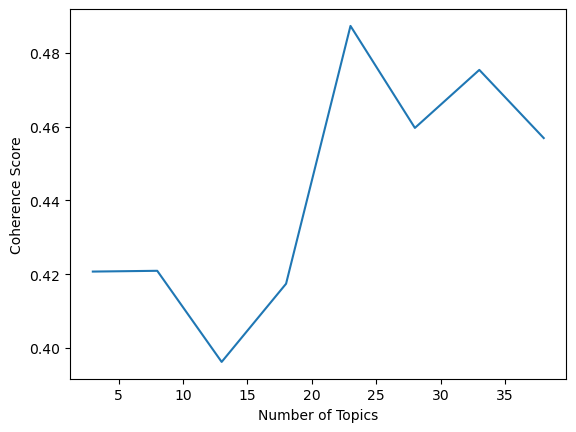

In [567]:
# Calculate coherence scores for different numbers of topics
from gensim.models.ldamodel import LdaModel
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt

grdictionary = Dictionary(grouped_tweets['tokens'])
grcorpus = [grdictionary.doc2bow(text) for text in grouped_tweets['tokens']]

min_topics = 3
max_topics = 40
step_size = 5
grcoherence_scores = []
grperplexity_scores = []
for num_topics in range(min_topics, max_topics+1, step_size):
    gr_lda_model = LdaModel(
        corpus=grcorpus,
        id2word=grdictionary,
        num_topics=num_topics,
        random_state=100,
        update_every=1,
        chunksize=100,
        passes=50,
        alpha='auto',
        per_word_topics=True
    )
    gr_coherence_model_lda = CoherenceModel(
        model=gr_lda_model,
        texts=grouped_tweets['tokens'],
        dictionary=grdictionary,
        coherence='c_v'
    )
    grcoherence_scores.append(gr_coherence_model_lda.get_coherence())
    grperplexity_scores.append(gr_lda_model.log_perplexity(grcorpus))

# Plot coherence scores against number of topics
plt.plot(range(min_topics, max_topics+1, step_size), grcoherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.show()

In [114]:
grcoherence_scores

[0.4207071329103076,
 0.4209157875258088,
 0.3961915082736561,
 0.4174061619972323,
 0.48736331795857213,
 0.4596862627168471,
 0.4754313362024385,
 0.4569355685280417]

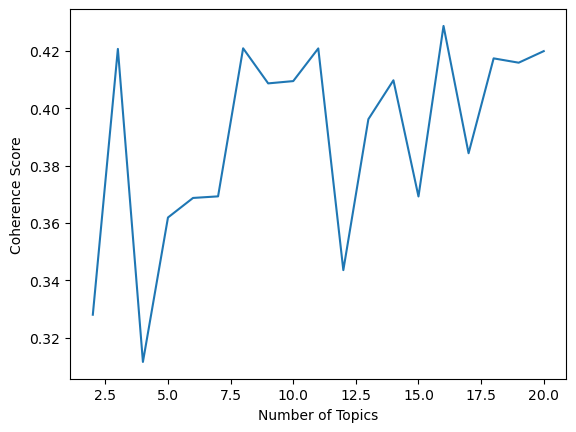

In [547]:
# Calculate coherence scores for different numbers of topics
from gensim.models.ldamodel import LdaModel
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt

grdictionary = Dictionary(grouped_tweets['tokens'])
grcorpus = [grdictionary.doc2bow(text) for text in grouped_tweets['tokens']]

min_topics = 2
max_topics = 20
step_size = 1
grcoherence_scores = []
grperplexity_scores = []
for num_topics in range(min_topics, max_topics+1, step_size):
    gr_lda_model = LdaModel(
        corpus=grcorpus,
        id2word=grdictionary,
        num_topics=num_topics,
        random_state=100,
        update_every=1,
        chunksize=100,
        passes=50,
        alpha='auto',
        per_word_topics=True
    )
    gr_coherence_model_lda = CoherenceModel(
        model=gr_lda_model,
        texts=grouped_tweets['tokens'],
        dictionary=grdictionary,
        coherence='c_v'
    )
    grcoherence_scores.append(gr_coherence_model_lda.get_coherence())
    grperplexity_scores.append(gr_lda_model.log_perplexity(grcorpus))

# Plot coherence scores against number of topics
plt.plot(range(min_topics, max_topics+1, step_size), grcoherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.show()

In [548]:
grcoherence_scores

[0.3279814016567183,
 0.4207071329103076,
 0.311512968086252,
 0.3618932524598337,
 0.36871497340600734,
 0.3692667857601827,
 0.4209157875258088,
 0.4086772501650186,
 0.40947623290116697,
 0.4208771226830697,
 0.34353667654966524,
 0.3961915082736561,
 0.40976288226628016,
 0.3692259831029408,
 0.4287239299977858,
 0.38430984793440204,
 0.4174061619972323,
 0.41589651652481135,
 0.4199289577386655]

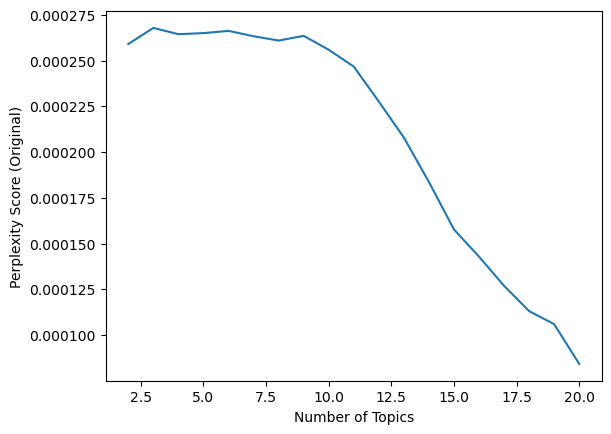

In [551]:
import matplotlib.pyplot as plt
from math import exp

# perplexity_scores contains perplexity scores for each number of topics
# assuming it is a 1D numpy array or list
gr_original_perplexity_scores = [exp(score) for score in grperplexity_scores]

# plot the original perplexity scores against the number of topics
num_topics = range(2, 21)
plt.plot(num_topics, gr_original_perplexity_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Perplexity Score (Original)')
plt.show()

In [552]:
gr_original_perplexity_scores

[0.0002591130397300237,
 0.00026788383649764774,
 0.0002644618944706464,
 0.00026505163268551003,
 0.0002662741708870519,
 0.0002633330104214781,
 0.00026098048631491023,
 0.00026355125945055403,
 0.00025596021473779385,
 0.00024673417048123186,
 0.0002276251643389963,
 0.00020794574755514635,
 0.0001836463242254883,
 0.00015769967234335013,
 0.0001428429143538161,
 0.00012690863464152646,
 0.00011310544990846611,
 0.00010594044229169214,
 8.421648595559486e-05]

## Applying LDA

In [611]:
#Using LDA after choosing K
grgensim_dictionary = corpora.Dictionary(grouped_tweets['tokens'])

grtexts = grouped_tweets['tokens']

grgensim_corpus = [grgensim_dictionary.doc2bow(text) for text in grtexts]

gr_lda_model = gensim.models.ldamodel.LdaModel(

   corpus=grgensim_corpus, id2word=grgensim_dictionary, num_topics=16, random_state=100, 

   update_every=1, chunksize=100, passes=50, alpha='auto', per_word_topics=True,

)

gr_coherence_model_lda = CoherenceModel(

   model=gr_lda_model, texts=grouped_tweets['tokens'], dictionary=grgensim_dictionary, coherence='c_v')

gr_coherence_lda = gr_coherence_model_lda.get_coherence()

print('\nCoherence Score: ', gr_coherence_lda)


Coherence Score:  0.4287239299977858


## KL Divergence

In [612]:
import numpy as np
from scipy.stats import entropy

gr_topic_term_dists = gr_lda_model.get_topics()
gr_num_topics = gr_lda_model.num_topics

gr_kl_divs = np.zeros((gr_num_topics, gr_num_topics))
for i in range(gr_num_topics):
    for j in range(i+1, gr_num_topics):
        gr_kl_divs[i,j] = entropy(gr_topic_term_dists[i], gr_topic_term_dists[j])
        gr_kl_divs[j,i] = entropy(gr_topic_term_dists[j], gr_topic_term_dists[i])

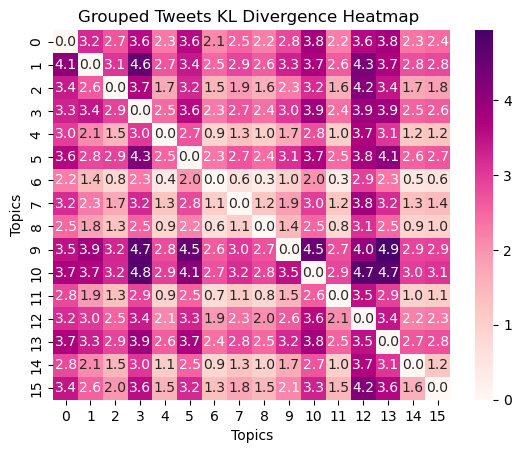

In [613]:

import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(gr_kl_divs, cmap="RdPu", annot=True, fmt=".1f")
plt.title("Grouped Tweets KL Divergence Heatmap ")
plt.xlabel("Topics")
plt.ylabel("Topics")
plt.show()

## Intertopic Distance Mapping

This cell might not show an output after exporting it from Jupytr for reasons unknown. Running the cell will definitely showcase the results. Alternatively, using the file in colab will show the results.

In [195]:
pyLDAvis.enable_notebook()
vis2 = pyLDAvis.gensim.prepare(gr_lda_model, grgensim_corpus, grgensim_dictionary, sort_topics=False)
pyLDAvis.display(vis2)

C:\Users\sahre\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



In [615]:
pyLDAvis.save_html(vis2, 'lda2.html')

This cell might not show an output after exporting it from Jupytr for reasons unknown. Running the cell will definitely showcase the results. 

In [201]:
import numpy as np

mdiff, annotation = gr_lda_model.diff(gr_lda_model, distance='jaccard', num_words=50)


In [202]:
plot_difference(mdiff, title="Topic difference (one model) [jaccard distance]", annotation=annotation)

C:\Users\sahre\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\sahre\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [554]:
#gr_original_perplexity_scores

## Comparitive Analysis

Below, we are comparing the coherence scores in the two models on a single graph

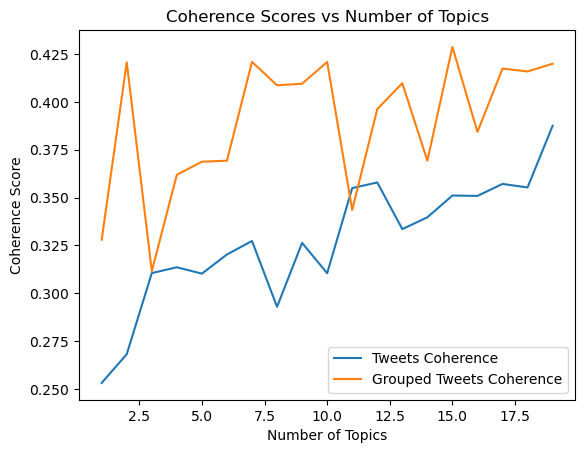

In [152]:
import matplotlib.pyplot as plt

topics = list(range(1, 20))


plt.plot(topics, coherence_scores, label='Tweets Coherence')
plt.plot(topics, grcoherence_scores, label='Grouped Tweets Coherence')

plt.title('Coherence Scores vs Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')


plt.legend()

plt.show()

## Dominant Topic Contribution in Model 1

In [358]:
# Code provided by Professor Joemon Jose in lab Materials
def format_topics_sentences(ldamodel=lda_model, corpus=gensim_corpus, texts=tweets['tokens']):

    sent_topics_df = pd.DataFrame()


    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            

        row = sorted(row, key=lambda x: (x[1]), reverse=True)

        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']


    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=gensim_corpus, texts=tweets['tokens'])


df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

C:\Users\sahre\AppData\Local\Temp\ipykernel_23780\3658800266.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
C:\Users\sahre\AppData\Local\Temp\ipykernel_23780\3658800266.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,13,0.3704,"veri, ani, man, famili, ireland, keep, home, s...","[pansexualflow, certain, us, restor, veri, unl..."
1,1,13,0.3870,"veri, ani, man, famili, ireland, keep, home, s...","[china, chines, foreign, ministri, weather, ba..."
2,2,13,0.3341,"veri, ani, man, famili, ireland, keep, home, s...","[began, understand, children, oper, scheme, pu..."
3,3,4,0.2594,"world, realli, week, wale, bad, th, elect, hap...","[excess_death, skyrocket, england, wale, death..."
4,4,5,0.2104,"labour, time, work, back, tori, scotland, well...","[scotland, syria, south_africa, south, korea]"
5,5,15,0.4472,"conserv, vote, race, news, call, anoth, liber,...","[hors_race, histori, today, race, th_februari,..."
6,6,6,0.2563,"us, onli, hope, rememb, sunak, exact, skynew, ...","[ridicul, servic, store, rememb, whi, order, m..."
7,7,9,0.4851,"london, england, live, vs, citi, start, part, ...","[chelsea, vs, fulham, live, stream, premier_le..."
8,8,9,0.1918,"london, england, live, vs, citi, start, part, ...","[check, snake, eye, dvd, bo, ebay_via, ebay_uk]"
9,9,9,0.2231,"london, england, live, vs, citi, start, part, ...","[de, sovereignti, babylon, citi, whose, founda..."


## Dominant Topic Distribution in Model 2

In [555]:
# Code provided by Professor Joemon Jose in lab Materials
def format_topics_sentences(ldamodel=gr_lda_model, corpus=grgensim_corpus, texts=grouped_tweets['tokens']):
    # Init output
    sent_topics_df = pd.DataFrame()

  
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
       
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
      
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=gr_lda_model, corpus=grgensim_corpus, texts=grouped_tweets['tokens'])


gr_df_dominant_topic = df_topic_sents_keywords.reset_index()
gr_df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
gr_df_dominant_topic.head(10)

C:\Users\sahre\AppData\Local\Temp\ipykernel_23780\3164933974.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
C:\Users\sahre\AppData\Local\Temp\ipykernel_23780\3164933974.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,12,0.4647,"uk, one, labour, back, tori, day, scotland, wh...","[pansexualflow, certain, us, restor, veri, unl..."
1,1,5,0.3861,"london, link, england, wale, check, via, live,...","[china, chines, foreign, ministri, weather, ba..."
2,2,12,0.4506,"uk, one, labour, back, tori, day, scotland, wh...","[began, understand, children, oper, scheme, pu..."
3,3,5,0.5212,"london, link, england, wale, check, via, live,...","[excess_death, skyrocket, england, wale, death..."
4,4,15,0.7354,"etc, similar_cultur, labour_shortag_hospit_agr...","[scotland, syria, south_africa, south, korea, ..."
5,5,13,0.4130,"uk, love, race, great, pleas, team, free, best...","[hors_race, histori, today, race, th_februari,..."
6,6,12,0.3795,"uk, one, labour, back, tori, day, scotland, wh...","[ridicul, servic, store, rememb, whi, order, m..."
7,7,5,0.3279,"london, link, england, wale, check, via, live,...","[check, snake, eye, dvd, bo, ebay_via, ebay_uk..."
8,8,12,0.3165,"uk, one, labour, back, tori, day, scotland, wh...","[de, sovereignti, babylon, citi, whose, founda..."
9,9,12,0.7418,"uk, one, labour, back, tori, day, scotland, wh...","[break, law, shame, hunt, act, johnredwood, un..."


## Topic Comparison between Models (Jaccard Similarity)

We have already compared the topics in the models using Jaccard Distance. Here, we are comparing the topic distance **between** the two models.

This cell might not show an output after exporting it from Jupytr for reasons unknown. Running the cell will definitely showcase the results. 

In [205]:
mdiff, annotation = lda_model.diff(gr_lda_model, distance='jaccard', num_words=50)


In [206]:
plot_difference(mdiff, title="Topic difference (two models)[jaccard distance]", annotation=annotation)

C:\Users\sahre\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\sahre\anaconda3\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



## Word Cloud for Topics in Model 1

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transpose

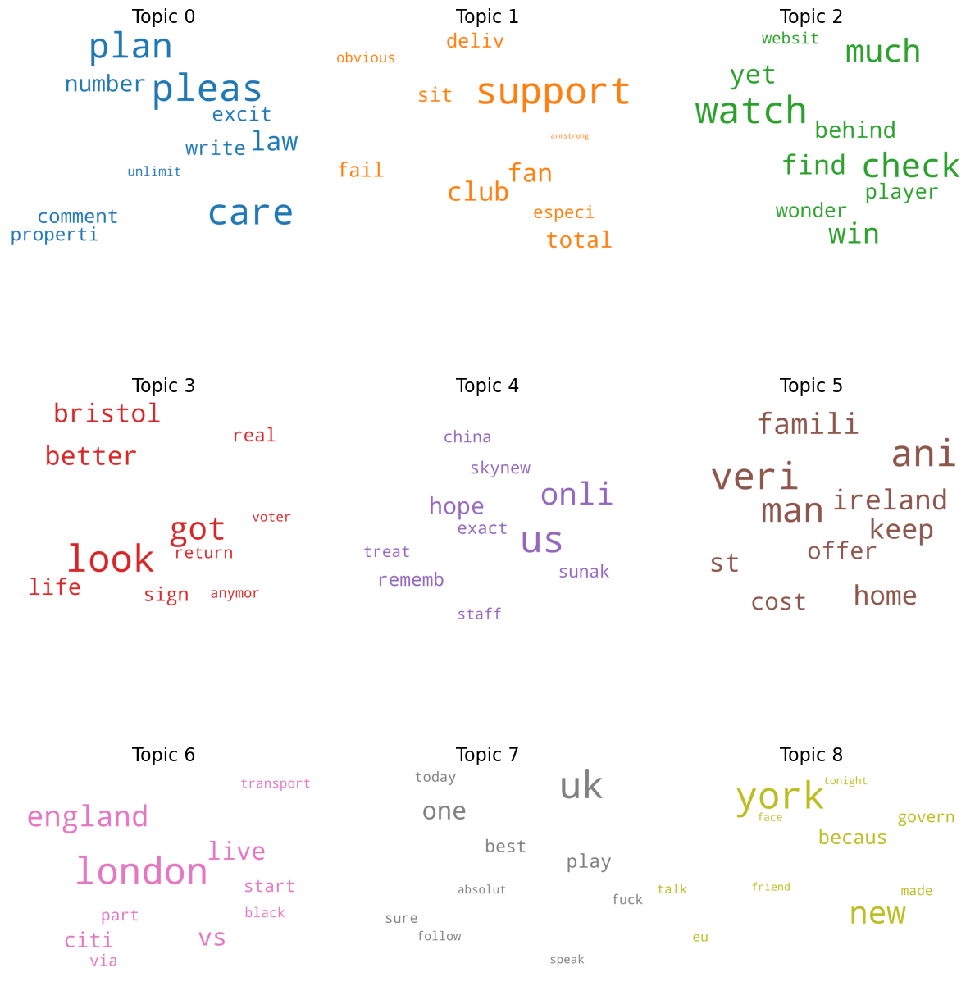

In [586]:
# Code provided by Professor Joemon Jose in lab Materials
### cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
from matplotlib import cm
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
cols += [color for name, color in mcolors.XKCD_COLORS.items()]
cols += [cm.tab20(i) for i in range(20)]
cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(3, 3, figsize=(12,15), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    if i < len(topics):
        fig.add_subplot(ax)
        topic_words = dict(topics[i][1])
        cloud.generate_from_frequencies(topic_words, max_font_size=300)
        plt.gca().imshow(cloud)
        plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transpose

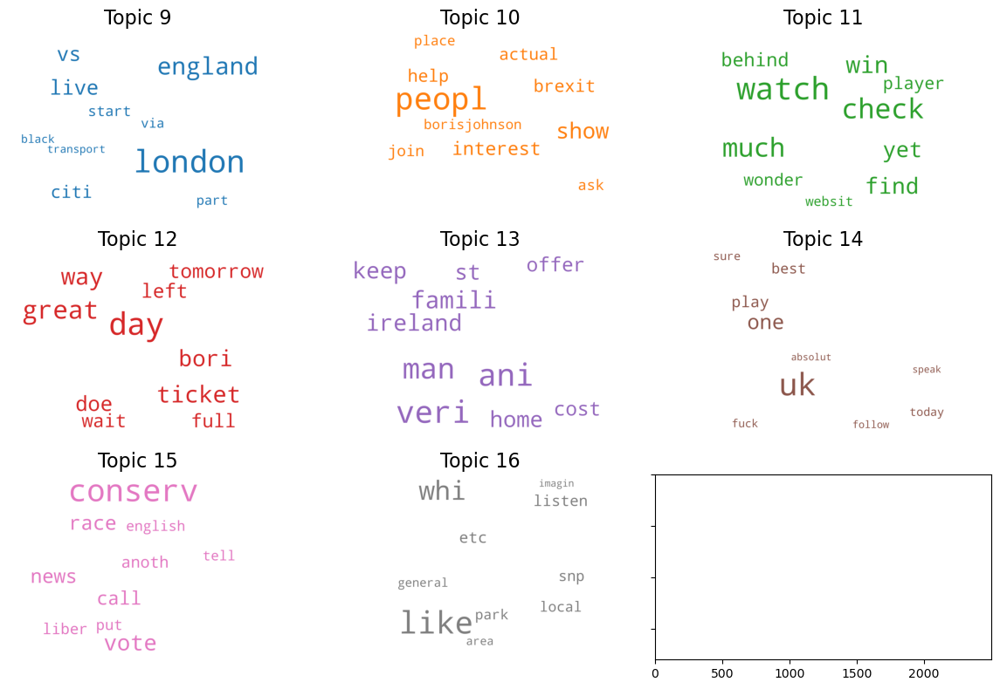

In [616]:
# Code provided by Professor Joemon Jose in lab Materials
from matplotlib import cm
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
cols += [color for name, color in mcolors.XKCD_COLORS.items()]
cols += [cm.tab20(i) for i in range(20)]


stop_words = set(STOPWORDS)


cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)


model2_topics = lda_model.show_topics(num_topics=17, num_words=10, formatted=False)


fig, axes = plt.subplots(3, 3, figsize=(12, 8), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    if i+9 < len(model2_topics):
        fig.add_subplot(ax)
        topic_words = dict(model2_topics[i+9][1])
        cloud.generate_from_frequencies(topic_words, max_font_size=300)
        plt.gca().imshow(cloud)
        plt.gca().set_title('Topic ' + str(i+9), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()



## Word Cloud for Topics in Model 2

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transpose

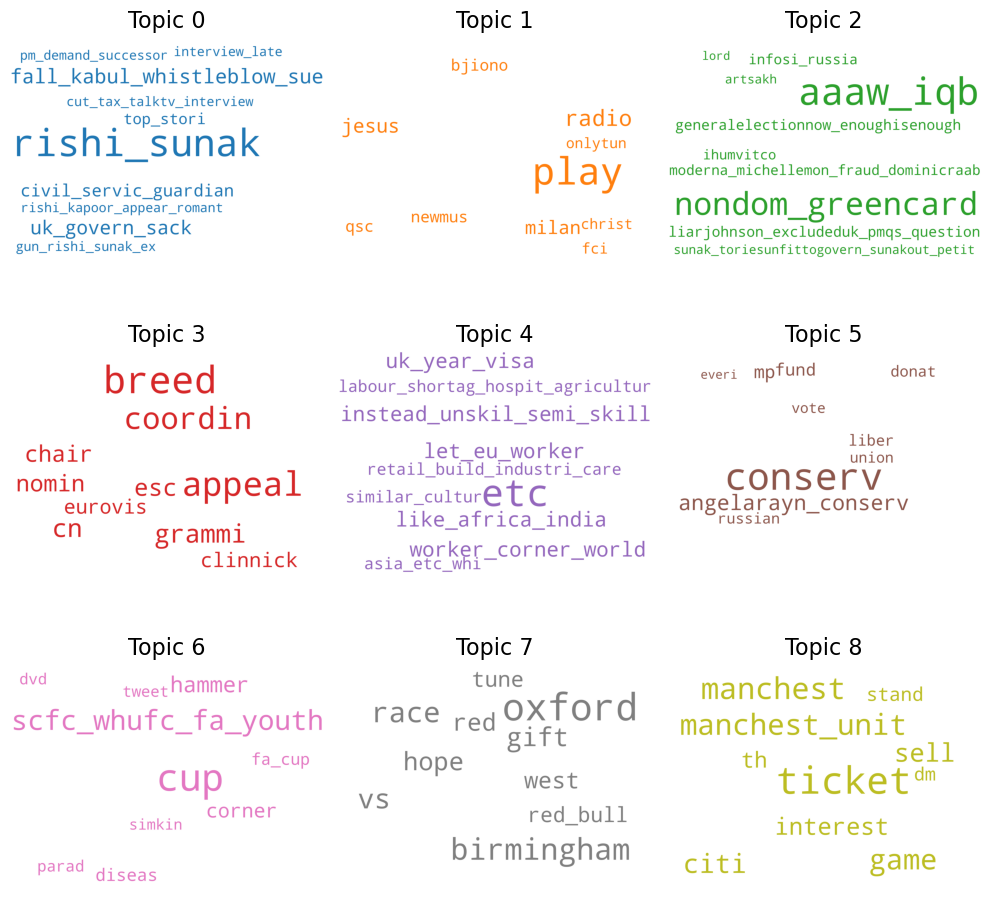

In [435]:
# Code provided by Professor Joemon Jose in lab Materials
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = gr_lda_model.show_topics(num_topics=15, num_words=30, formatted=False) ## need to change the "Ida_model" to"model", because "Ida_model"is not defined before.

fig, axes = plt.subplots(3, 3, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\sahre\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transpose

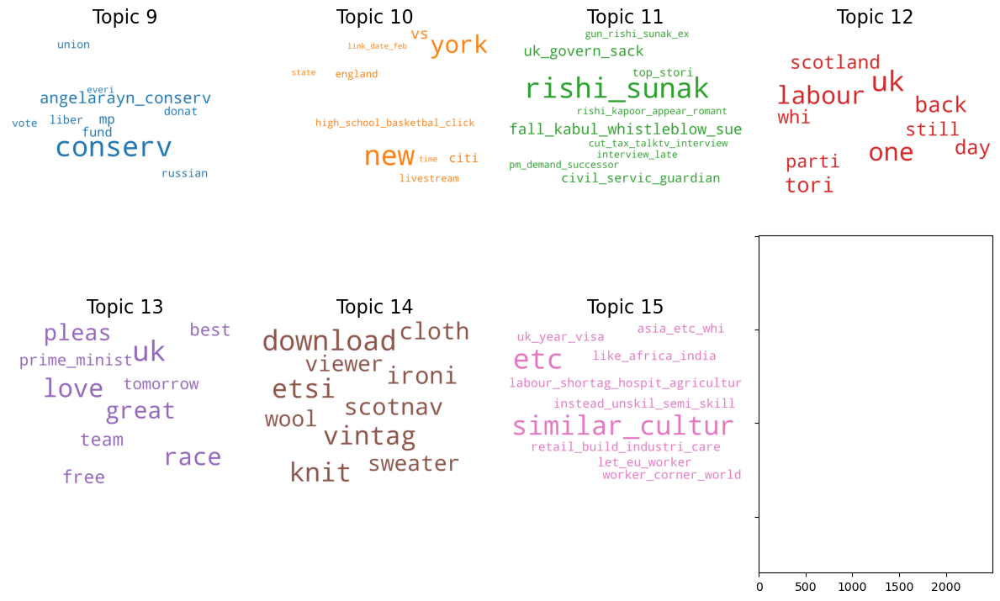

In [617]:
# Code provided by Professor Joemon Jose in lab Materials
from matplotlib import cm
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
cols += [color for name, color in mcolors.XKCD_COLORS.items()]
cols += [cm.tab20(i) for i in range(20)]


stop_words = set(STOPWORDS)


cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)


model2_topics = gr_lda_model.show_topics(num_topics=16, num_words=10, formatted=False)


fig, axes = plt.subplots(2, 4, figsize=(12, 8), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    if i+9 < len(model2_topics):
        fig.add_subplot(ax)
        topic_words = dict(model2_topics[i+9][1])
        cloud.generate_from_frequencies(topic_words, max_font_size=300)
        plt.gca().imshow(cloud)
        plt.gca().set_title('Topic ' + str(i+9), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()


## Topic Distribution

Here, we will set a threshold. Accroding to this threshold, all the documents that have a dominant topic distribution greater than 50% are considered as having a good distribution  and all the documents with a dominant topic distribution lesser than 20% are considered as having a bad distribution.

In [104]:
Model1_Good_Docs = df_dominant_topic[df_dominant_topic['Topic_Perc_Contrib'] >= 0.5]['Text']
Model1_Bad_Docs = df_dominant_topic[df_dominant_topic['Topic_Perc_Contrib'] < 0.2]['Text']

In [105]:

Model2_Good_Docs = gr_df_dominant_topic[gr_df_dominant_topic['Topic_Perc_Contrib'] >= 0.5]['Text']
Model2_Bad_Docs = gr_df_dominant_topic[gr_df_dominant_topic['Topic_Perc_Contrib'] < 0.2]['Text']


In [106]:
len(Model1_Good_Docs)

1

In [107]:
len(Model1_Bad_Docs)

9672

In [108]:
len(Model2_Good_Docs)

279

In [157]:
len(Model2_Bad_Docs)

0

## Topic Distribution in each Doument (Model 1)

In [45]:
for i, doc in enumerate(corpus):
    topic_probs = lda_model.get_document_topics(doc)
    top_topic = max(topic_probs, key=lambda x: x[1])[0]
    top_prob = max(topic_probs, key=lambda x: x[1])[1]
    print("Document {}: Top Topic = {}, Probability = {:.4f}".format(i, top_topic, top_prob))
    print("Topic Distribution: ")
    for topic, prob in topic_probs:
        print("Topic {}: {:.4f}".format(topic, prob))
    print("\n")

Document 0: Top Topic = 2, Probability = 0.3024
Topic Distribution: 
Topic 0: 0.0654
Topic 1: 0.1105
Topic 2: 0.3024
Topic 3: 0.0384
Topic 4: 0.0563
Topic 5: 0.0618
Topic 6: 0.0339
Topic 7: 0.0436
Topic 8: 0.0242
Topic 9: 0.0701
Topic 10: 0.0256
Topic 11: 0.0198
Topic 12: 0.0176
Topic 13: 0.0367
Topic 14: 0.0214
Topic 15: 0.0260
Topic 16: 0.0174
Topic 17: 0.0290


Document 1: Top Topic = 8, Probability = 0.4241
Topic Distribution: 
Topic 0: 0.0370
Topic 1: 0.0275
Topic 2: 0.0540
Topic 3: 0.0640
Topic 4: 0.0548
Topic 5: 0.0334
Topic 6: 0.0330
Topic 7: 0.0424
Topic 8: 0.4241
Topic 9: 0.0415
Topic 10: 0.0249
Topic 11: 0.0192
Topic 12: 0.0172
Topic 13: 0.0357
Topic 14: 0.0209
Topic 15: 0.0253
Topic 16: 0.0169
Topic 17: 0.0282


Document 2: Top Topic = 4, Probability = 0.3499
Topic Distribution: 
Topic 0: 0.0402
Topic 1: 0.1460
Topic 2: 0.0297
Topic 3: 0.0406
Topic 4: 0.3499
Topic 5: 0.0363
Topic 6: 0.0358
Topic 7: 0.0461
Topic 8: 0.0256
Topic 9: 0.0451
Topic 10: 0.0270
Topic 11: 0.0209
Top

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [147]:
len(coherence_scores)

19

In [148]:
len(grcoherence_scores)

19

## Topic Distribution in each Doument (Model 2)

In [472]:
for i, doc in enumerate(grgensim_corpus):
    topic_probs = gr_lda_model.get_document_topics(doc)
    top_topic = max(topic_probs, key=lambda x: x[1])[0]
    top_prob = max(topic_probs, key=lambda x: x[1])[1]
    print("Document {}: Top Topic = {}, Probability = {:.4f}".format(i, top_topic, top_prob))
    print("Topic Distribution: ")
    for topic, prob in topic_probs:
        print("Topic {}: {:.4f}".format(topic, prob))
    print("\n")

Document 0: Top Topic = 12, Probability = 0.4647
Topic Distribution: 
Topic 0: 0.1355
Topic 1: 0.0164
Topic 3: 0.0994
Topic 5: 0.0620
Topic 10: 0.0122
Topic 12: 0.4647
Topic 13: 0.1978


Document 1: Top Topic = 5, Probability = 0.3861
Topic Distribution: 
Topic 0: 0.0572
Topic 3: 0.0447
Topic 5: 0.3861
Topic 10: 0.0190
Topic 12: 0.2838
Topic 13: 0.0459
Topic 15: 0.1564


Document 2: Top Topic = 12, Probability = 0.4506
Topic Distribution: 
Topic 0: 0.0888
Topic 3: 0.1350
Topic 5: 0.0190
Topic 10: 0.0211
Topic 12: 0.4506
Topic 13: 0.2709


Document 3: Top Topic = 5, Probability = 0.5212
Topic Distribution: 
Topic 0: 0.0577
Topic 2: 0.0126
Topic 3: 0.0561
Topic 5: 0.5212
Topic 10: 0.0144
Topic 12: 0.2680
Topic 13: 0.0598


Document 4: Top Topic = 15, Probability = 0.7354
Topic Distribution: 
Topic 0: 0.1288
Topic 12: 0.1003
Topic 13: 0.0331
Topic 15: 0.7354


Document 5: Top Topic = 13, Probability = 0.4130
Topic Distribution: 
Topic 0: 0.0879
Topic 3: 0.1019
Topic 5: 0.0250
Topic 10: 0.

In [109]:
len(Model2_Bad_Docs)

0

In [135]:
import seaborn as sns

## Topic Document Matrix (Model 1)

<AxesSubplot:>

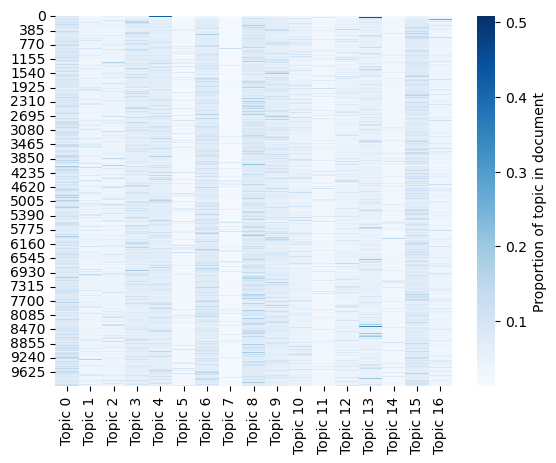

In [136]:
doc_topic_dist = []

for doc in corpus:
    topic_probs = lda_model.get_document_topics(doc)
    topic_dist = [0.0] * lda_model.num_topics
    for topic, prob in topic_probs:
        topic_dist[topic] = prob
    doc_topic_dist.append(topic_dist)
    
df = pd.DataFrame(doc_topic_dist, columns=['Topic {}'.format(i) for i in range(17)])

sns.heatmap(df, cmap='Blues', cbar_kws={'label': 'Proportion of topic in document'})

## Topic Document Matrix (Model 2)

<AxesSubplot:>

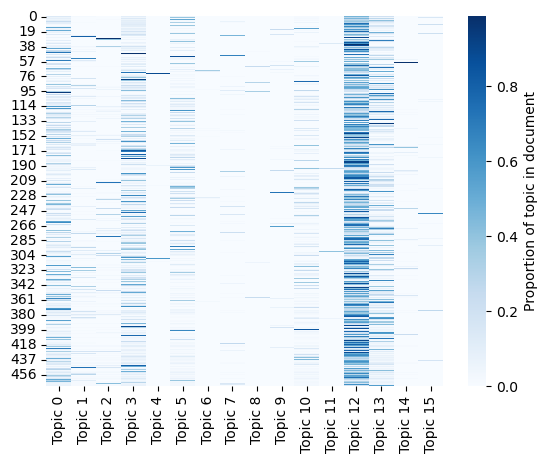

In [506]:
doc_topic_dist = []

for doc in grgensim_corpus:
    topic_probs = gr_lda_model.get_document_topics(doc)
    topic_dist = [0.0] * gr_lda_model.num_topics
    for topic, prob in topic_probs:
        topic_dist[topic] = prob
    doc_topic_dist.append(topic_dist)
    
df = pd.DataFrame(doc_topic_dist, columns=['Topic {}'.format(i) for i in range(16)])


sns.heatmap(df, cmap='Blues', cbar_kws={'label': 'Proportion of topic in document'})

## Top 10 words in all the topics in both Models

In [442]:
model1_topics = lda_model.show_topics(num_topics=17, num_words=10, formatted=False)

In [443]:
model2_topics = gr_lda_model.show_topics(num_topics=16, num_words=10, formatted=False)

In [444]:
model1_topics

[(0,
  [('york', 0.3082616),
   ('new', 0.20894302),
   ('becaus', 0.048187863),
   ('govern', 0.03206805),
   ('eu', 0.021269878),
   ('made', 0.020994058),
   ('talk', 0.018904962),
   ('friend', 0.013201144),
   ('face', 0.012878436),
   ('tonight', 0.012751807)]),
 (1,
  [('year', 0.118870616),
   ('give', 0.056132983),
   ('someon', 0.04335728),
   ('thought', 0.035194803),
   ('mayb', 0.034615226),
   ('everyon', 0.034474384),
   ('bring', 0.033020042),
   ('person', 0.031121563),
   ('prime_minist', 0.031098874),
   ('hous', 0.030991804)]),
 (2,
  [('pleas', 0.103502),
   ('care', 0.09808736),
   ('plan', 0.09120141),
   ('law', 0.04604655),
   ('number', 0.03375123),
   ('excit', 0.02541825),
   ('write', 0.025314802),
   ('comment', 0.02378654),
   ('properti', 0.021581003),
   ('unlimit', 0.008485251)]),
 (3,
  [('look', 0.15280712),
   ('got', 0.10877598),
   ('better', 0.067978755),
   ('bristol', 0.0662445),
   ('life', 0.048607506),
   ('sign', 0.034404583),
   ('real', 0

In [445]:
model2_topics

[(0,
  [('like', 0.038857855),
   ('well', 0.016696215),
   ('uk', 0.01099072),
   ('realli', 0.0077422727),
   ('look', 0.0071511474),
   ('man', 0.005530484),
   ('conserv', 0.005110215),
   ('peopl', 0.0050797253),
   ('us', 0.0050289966),
   ('world', 0.004584834)]),
 (1,
  [('ticket', 0.042053744),
   ('manchest', 0.025361821),
   ('manchest_unit', 0.02363309),
   ('game', 0.022527944),
   ('citi', 0.019416675),
   ('sell', 0.018066134),
   ('interest', 0.015549095),
   ('th', 0.013107916),
   ('stand', 0.009623929),
   ('dm', 0.008915986)]),
 (2,
  [('oxford', 0.020613315),
   ('birmingham', 0.012095306),
   ('race', 0.011077343),
   ('vs', 0.010169282),
   ('gift', 0.009068285),
   ('hope', 0.008499268),
   ('red', 0.00783752),
   ('west', 0.0070480253),
   ('tune', 0.006286453),
   ('red_bull', 0.00581936)]),
 (3,
  [('time', 0.031815756),
   ('uk', 0.028937034),
   ('peopl', 0.022606092),
   ('year', 0.016307281),
   ('part', 0.009079675),
   ('us', 0.0075553856),
   ('work', 